In [1]:
import pandas as pd
import seaborn as sns
from pandas_profiling import ProfileReport
from funpymodeling.exploratory import cat_vars, num_vars
import numpy as np

C:\Users\gusta\miniconda3\lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\gusta\miniconda3\lib\site-packages\visions\backends\shared\nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


### Preparação dos Dados

In [2]:
data=pd.read_csv("https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv")

# Removendo duplicidades
data=data.drop_duplicates(subset="track_id")

x_data=data.drop(cat_vars(data), axis=1)

x_data=x_data.drop(['key','speechiness', 'mode', 'tempo', 'duration_ms'], axis=1)

In [3]:
data.shape

(28356, 23)

###  PCA

In [5]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x_data)

Geramos o modelo e ajustamos:

In [6]:
from sklearn.decomposition import PCA

model_pca = PCA()

x_pca = model_pca.fit_transform(x_scaled)

In [7]:
var_explicada_pca = model_pca.explained_variance_ratio_
var_explicada_pca

array([0.26718277, 0.17844569, 0.14004096, 0.12199857, 0.10753268,
       0.08223481, 0.0748838 , 0.02768073])

**Interpretação**:

O primeiro componente contribui com 26% da variância explicada, o segundo com 17% e assim por diante.

# UMAP

UMAP é um método de redução de dimensionalidade não linear e é muito eficaz na visualização de clusters ou grupos de pontos de dados e suas proximidades relativas.

Link de interesse:

* https://towardsdatascience.com/dimensionality-reduction-for-data-visualization-pca-vs-tsne-vs-umap-be4aa7b1cb29

In [8]:
import umap #pip3 install umap-learn

In [9]:
x_scaled = StandardScaler()

x_scaled = x_scaled.fit_transform(x_data)

In [10]:
model_umap = umap.UMAP()

In [11]:
model_umap_fit_transform = model_umap.fit_transform(x_scaled)
model_umap_fit_transform.shape

(28356, 2)

Visualização interativa com Plotly!

In [12]:
data2 = data.copy() 
data2['cancion'] = data2['track_artist'] + ' | ' + data2['track_name'] #Creamos una nueva variable llamada: cancion
data2[['dim1', 'dim2']] = model_umap_fit_transform #Agregamos las dos dimensiones generadas por umap

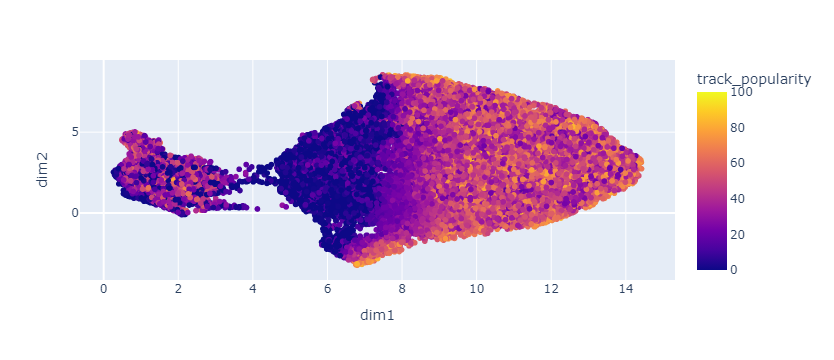

In [13]:
import plotly.express as px

fig = px.scatter(data2, x="dim1", y="dim2", color="track_popularity", hover_data=['cancion'])
fig.show()